In [ ]:
%%capture
!test -d ./TCC-EEG && rm -r TCC-EEG
%cd /content/
!git clone https://github.com/TheoMoutakanni/TCC-EEG.git
%cd /content/TCC-EEG/
!pip install -U https://api.github.com/repos/braindecode/braindecode/zipball/master

In [31]:
%load_ext autoreload 
%autoreload 1
%aimport models, utils
from importlib import reload
reload(utils.linear)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


<module 'utils.linear' from '/home/theo/Documents/TCC-EEG/utils/linear.py'>

In [32]:
from braindecode.util import set_random_seeds
from braindecode.datasets.base import BaseConcatDataset
import matplotlib.pyplot as plt
import numpy as np
import pickle
from skorch.callbacks import EpochScoring, ProgressBar
from skorch.helper import predefined_split
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from tqdm.notebook import tqdm

import torch

from utils.datasets import get_sleep_physionet, split_dataset, list_of_train_sets
from utils.skorch import EEGTransformer
from utils.plot import (sleep_cmap, rand_cmap, plot_embeddings, get_ages, get_sleep_stages, get_subjects)
from utils.linear import plot_knn
from models.contrastive import ContrastiveModule, EncoderNet, ClassifierNet, train_and_test

In [2]:
seed = 42
np.random.seed(seed)
torch.manual_seed(seed)

# Contrastive Task Training

## Dataset Creation

In [3]:
%%capture
# full dataset, to get a small one, use: get_sleep_physionet(range(10))
windows_dataset, info = get_sleep_physionet()

In [4]:
self_train_set, self_valid_set, full_train_set, valid_set, test_set, subjects_dic = split_dataset(windows_dataset)
print(len(self_train_set), len(self_valid_set), len(full_train_set), len(valid_set), len(test_set))

59428 9820 69248 9880 9047


In [5]:
from utils.datasets import TimeContrastiveDataset
subjects = list(windows_dataset.split('subject').keys())
self_train_sets = list_of_train_sets(subjects_dic['self_train_subjects'], self_train_set, TimeContrastiveDataset, {'delta_index_positive':5, 'delta_index_negative':20})

## Encoder Training

In [6]:
n_channels = 2
p_dropout = 0.2

lr = 5e-4
batch_size = 100
max_nb_epochs = 200
early_stopping_patience = 10

networks, skorch_nets, nb_subjects = [], [], []

for self_train_set in self_train_sets[:100:5]:
    encoder = EncoderNet(feat_per_layer=[32, 64, 128], n_channels=n_channels, p_dropout=p_dropout, apply_batch_norm=False)
    network = ContrastiveModule(encoder)
    nb_subject = len(self_train_set.split('subject'))
    nb_subjects.append(nb_subject)
    if os.path.isfile('./experiences/nb_patients/contrastive_network_{}.pkl'.format(nb_subject)):
        print('Loading: ', nb_subject)
        #network.load_state_dict(torch.load('./experiences/nb_patients/contrastive_network_{}.pt'.format(nb_subject)))
        with open('./experiences/nb_patients/contrastive_network_{}.pkl'.format(nb_subject), 'rb') as f:
            skorch_net = pickle.load(f)
        network = skorch_net.module_
    else:
        print('Training: ', nb_subject)
        skorch_net = network.train_(
            self_train_set, self_valid_set, lr=lr, batch_size=batch_size,
            max_nb_epochs=max_nb_epochs, early_stopping_patience=early_stopping_patience)
        torch.save(network.state_dict(), './experiences/nb_patients/contrastive_network_{}.pt'.format(nb_subject))
        with open('./experiences/nb_patients/contrastive_network_{}.pkl'.format(nb_subject), 'wb') as f:
            pickle.dump(skorch_net, f)
    networks.append(network)
    skorch_nets.append(skorch_net)

Loading:  1
Loading:  6
Loading:  11
Loading:  16
Loading:  21
Loading:  26
Loading:  31
Loading:  36
Loading:  41
Loading:  46


## Predictions

In [7]:
splitted = windows_dataset.split('subject')
all_valid_set = TimeContrastiveDataset([splitted[s] for s in subjects_dic['self_valid_subjects'] + subjects_dic['valid_subjects']], delta_index_positive=5, delta_index_negative=20)

In [8]:
# Embeddings
embds_list = [skorch_net.transform(all_valid_set)[::2] for skorch_net in tqdm(skorch_nets)]
# PCA
pca_list = [PCA(2) for _ in range(len(embds_list))]
pca_embds_list = [pca.fit_transform(embds) for pca, embds in tqdm(zip(pca_list, embds_list), total=len(embds_list))]
# TSNE
tsne_list = [TSNE(2, n_jobs=-1) for _ in range(len(embds_list))]
tsne_embds_list = [tsne.fit_transform(embds) for tsne, embds in tqdm(zip(tsne_list, embds_list), total=len(embds_list))]

# Plots

Text(0.5, 0, 'nb subjects')

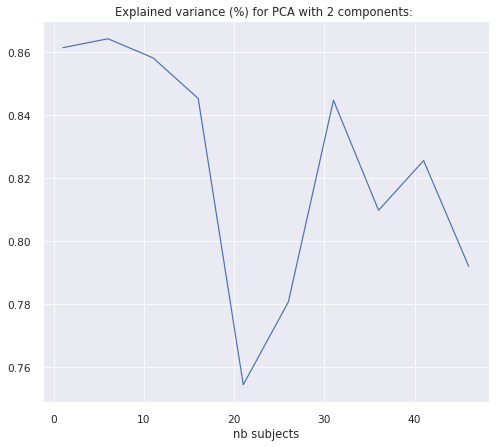

In [9]:
plt.plot(nb_subjects, [pca.explained_variance_ratio_.sum() for pca in pca_list])
plt.title('Explained variance (%) for PCA with 2 components: ')
plt.xlabel('nb subjects')

In [10]:
sleep_stages = get_sleep_stages(all_valid_set)
ages = get_ages(all_valid_set, info)
subjects = get_subjects(all_valid_set)

In [11]:
new_cmap = rand_cmap(max(subjects)+1, type='bright', first_color_black=True,
                     last_color_black=False, verbose=False)
mapping = {  # We merge stages 3 and 4 following AASM standards.
    'Sleep stage W': 0,
    'Sleep stage 1': 1,
    'Sleep stage 2': 2,
    'Sleep stage 3': 3,
    'Sleep stage 4': 3,
    'Sleep stage R': 4
}
reverse_mapping = {v: k[-1] for k,v in mapping.items()}

## Patient ID

100%|██████████| 10/10 [05:14<00:00, 31.41s/it]


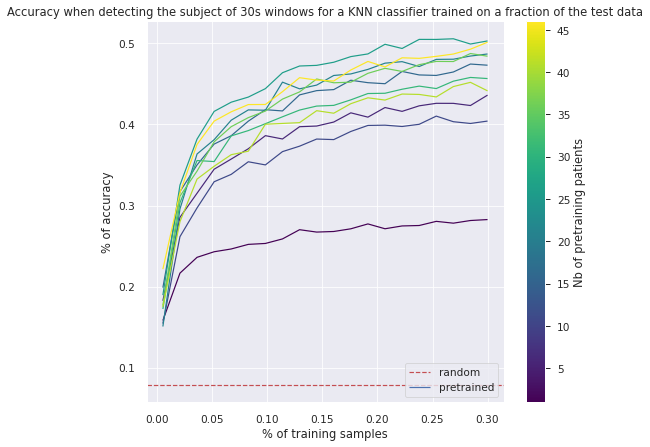

In [20]:
plot_knn(embds_list, subjects, cmap_values=nb_subjects, colorbar_title='Nb of pretraining patients', verbose=1)
plt.legend(['random', 'pretrained'], loc='lower right')
plt.savefig('img/patient_detection.png', dpi=200, bbox_inches='tight', pad_inches=0, facecolor=(1,1,1,0))
plt.title('Accuracy when detecting the subject of 30s windows for a KNN classifier trained on a fraction of the test data');

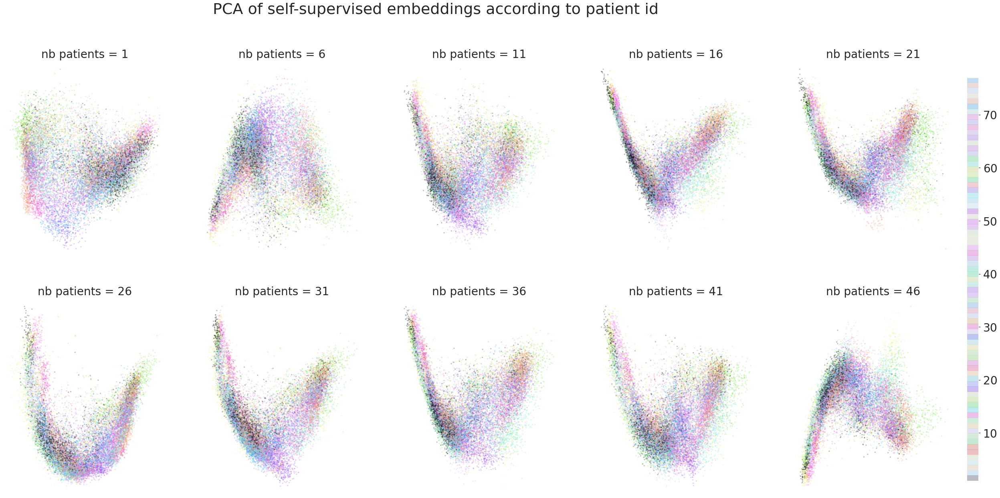

In [13]:
fig = plt.figure(figsize=(40,20))
for i, pca_embds in enumerate(pca_embds_list):
    ax = plt.subplot(2,5,i+1)
    im = plot_embeddings(pca_embds, subjects, new_cmap, alpha=0.2, colorbar=False)
    plt.title("nb patients = {}".format(nb_subjects[i]), fontsize=28)

# Put colorbar to the right
fig.subplots_adjust(right=0.95)
cbar_ax = fig.add_axes([0.96, 0.15, 0.01, 0.7])
cb = fig.colorbar(im, cax=cbar_ax)
cb.ax.tick_params(labelsize=28)

plt.savefig('img/patient_id_per_size.png', dpi=50, bbox_inches='tight', pad_inches=0, transparent=True)
plt.suptitle('PCA of self-supervised embeddings according to patient id', fontsize=38);

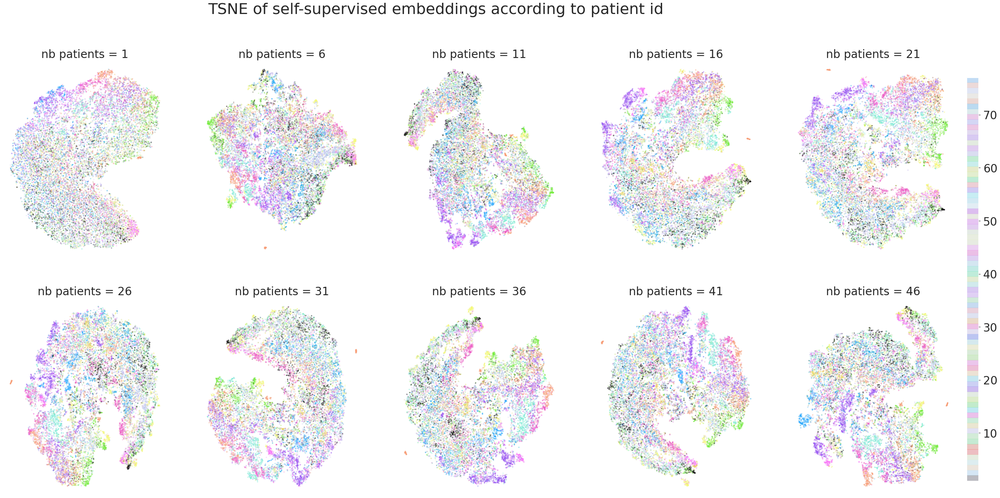

In [14]:
fig = plt.figure(figsize=(40,20))
for i, tsne_embds in enumerate(tsne_embds_list):
    plt.subplot(2,5,i+1)
    im = plot_embeddings(tsne_embds, subjects, new_cmap, alpha=0.2, colorbar=False)
    plt.title("nb patients = {}".format(nb_subjects[i]), fontsize=28)

# Put colorbar to the right
fig.subplots_adjust(right=0.95)
cbar_ax = fig.add_axes([0.96, 0.15, 0.01, 0.7])
cb = fig.colorbar(im, cax=cbar_ax)
cb.ax.tick_params(labelsize=28)

plt.savefig('img/patient_id_per_size_tsne.png', dpi=50, bbox_inches='tight', pad_inches=0, transparent=True)
plt.suptitle('TSNE of self-supervised embeddings according to patient id', fontsize=38);

## Sleep Stages

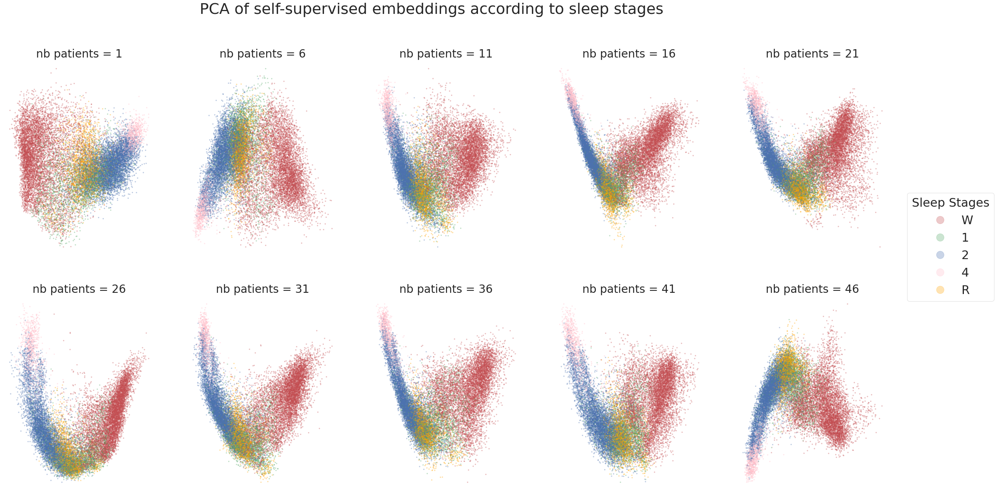

In [72]:
fig = plt.figure(figsize=(40,20))
for i, pca_embds in enumerate(pca_embds_list):
    plt.subplot(2,5,i+1)
    im = plot_embeddings(pca_embds, sleep_stages, sleep_cmap, colorbar=False)
    plt.title("nb patients = {}".format(nb_subjects[i]), fontsize=28)

# Add legend to the right
legend = fig.legend(*im.legend_elements(prop="colors"),
                    loc="right", title='Sleep Stages', markerscale=4., fontsize=30, title_fontsize=30, facecolor='None')
for i in range(len(legend.get_texts())):
    legend.get_texts()[i].set_text(reverse_mapping[i])
    
plt.savefig('img/sleep_stages_per_size.png', dpi=50, bbox_inches='tight', pad_inches=0, transparent=True)
plt.suptitle("PCA of self-supervised embeddings according to sleep stages", fontsize=38);

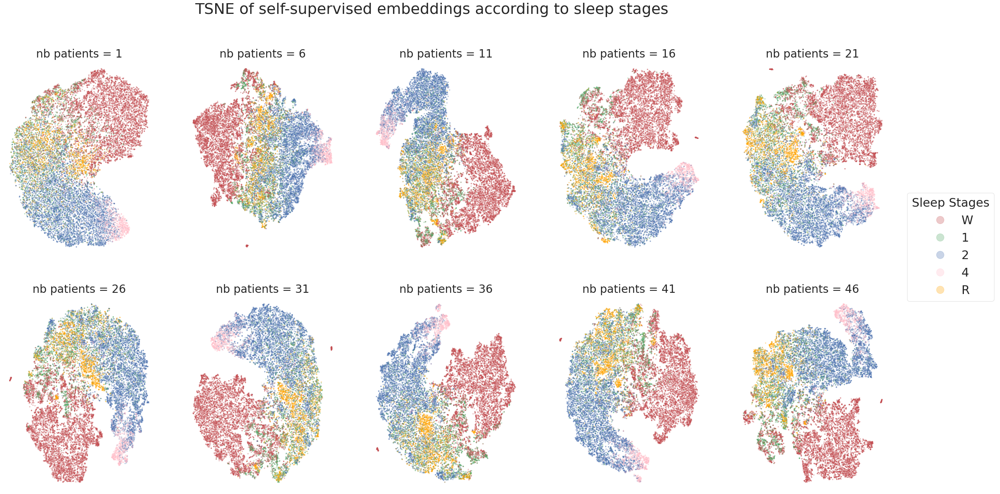

In [71]:
fig = plt.figure(figsize=(40,20))
for i, tsne_embds in enumerate(tsne_embds_list):
    plt.subplot(2,5,i+1)
    im = plot_embeddings(tsne_embds, sleep_stages, sleep_cmap, colorbar=False)
    plt.title("nb patients = {}".format(nb_subjects[i]), fontsize=28)

# Add legend to the right
legend = fig.legend(*im.legend_elements(prop="colors"),
                    loc="right", title='Sleep Stages', markerscale=4., fontsize=30, title_fontsize=30, facecolor='None')
for i in range(len(legend.get_texts())):
    legend.get_texts()[i].set_text(reverse_mapping[i])

plt.savefig('img/sleep_stages_per_size_tsne.png', dpi=50, bbox_inches='tight', pad_inches=0, transparent=True)
plt.suptitle("TSNE of self-supervised embeddings according to sleep stages", fontsize=38);

100%|██████████| 10/10 [05:11<00:00, 31.13s/it]


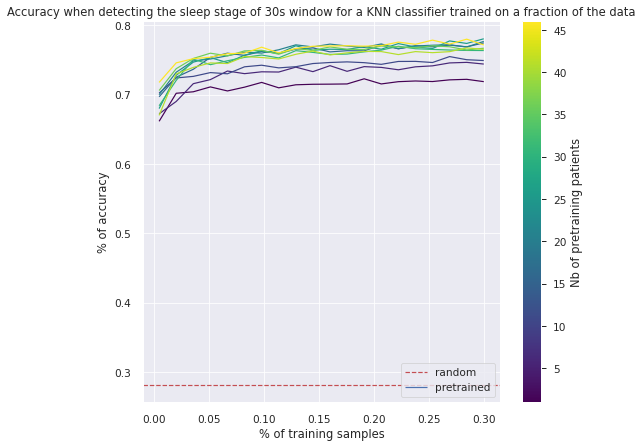

In [113]:
plot_knn(embds_list, sleep_stages, cmap_values=nb_subjects, colorbar_title='Nb of pretraining patients', verbose=1)
plt.legend(['random', 'pretrained'], loc='lower right')
plt.savefig('img/sleep_stages_detection.png', dpi=200, bbox_inches='tight', pad_inches=0, facecolor=(1,1,1,0))
plt.title('Accuracy when detecting the sleep stage of 30s window for a KNN classifier trained on a fraction of the data');

## Age

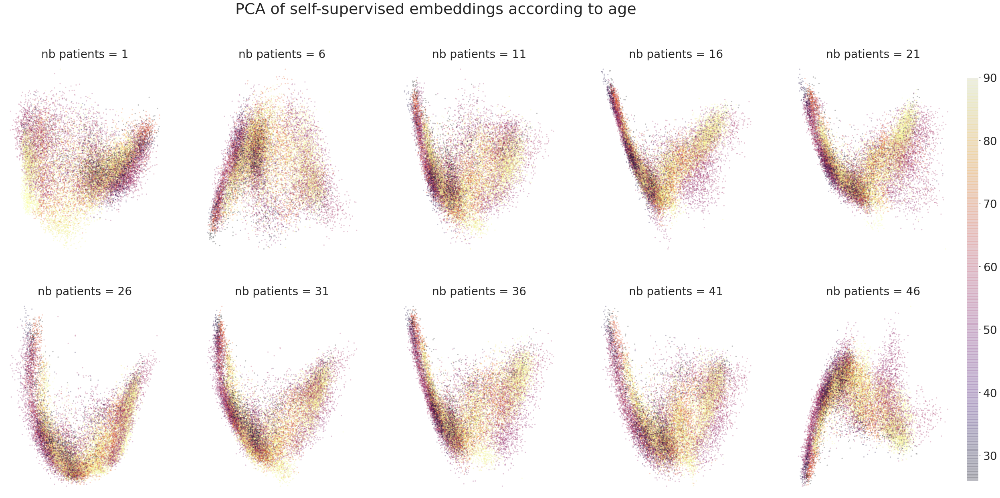

In [67]:
fig = plt.figure(figsize=(40,20))
for i, pca_embds in enumerate(pca_embds_list):
    plt.subplot(2,5,i+1)
    im = plot_embeddings(pca_embds, ages, plt.get_cmap('inferno'), alpha=0.2, colorbar=False)
    plt.title("nb patients = {}".format(nb_subjects[i]), fontsize=28)

# Put colorbar to the right
fig.subplots_adjust(right=0.95)
cbar_ax = fig.add_axes([0.96, 0.15, 0.01, 0.7])
cb = fig.colorbar(im, cax=cbar_ax, drawedges=False)
cb.ax.tick_params(labelsize=28)

plt.savefig('img/age_per_size.png', dpi=50, bbox_inches='tight', pad_inches=0, transparent=True)
plt.suptitle('PCA of self-supervised embeddings according to age', fontsize=38);

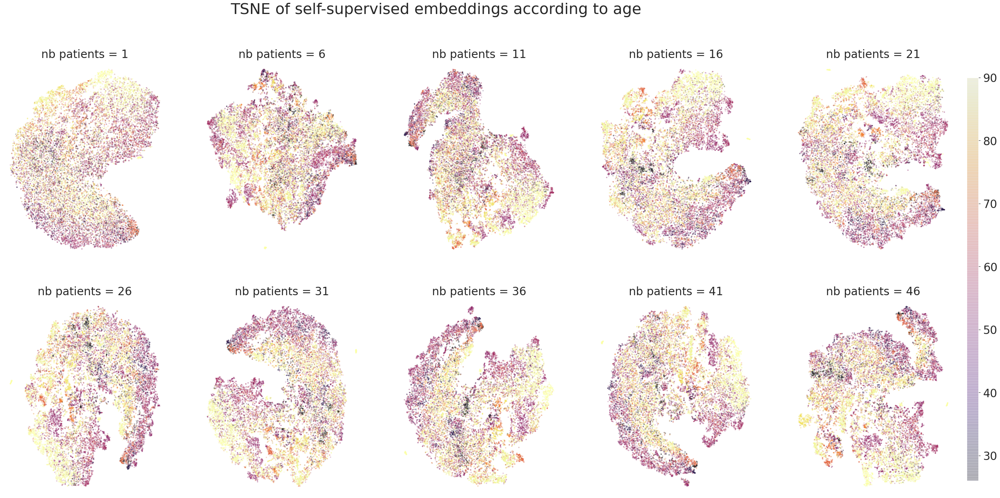

In [66]:
fig = plt.figure(figsize=(40,20))
for i, tsne_embds in enumerate(tsne_embds_list):
    plt.subplot(2,5,i+1)
    im = plot_embeddings(tsne_embds, ages, plt.get_cmap('inferno'), alpha=0.2, colorbar=False)
    plt.title("nb patients = {}".format(nb_subjects[i]), fontsize=28)

# Put colorbar to the right
fig.subplots_adjust(right=0.95)
cbar_ax = fig.add_axes([0.96, 0.15, 0.01, 0.7])
cb = fig.colorbar(im, cax=cbar_ax, drawedges=False)
cb.ax.tick_params(labelsize=28)

plt.savefig('img/age_per_size_tsne.png', dpi=50, bbox_inches='tight', pad_inches=0, transparent=True)
plt.suptitle('TSNE of self-supervised embeddings according to age', fontsize=38);

100%|██████████| 10/10 [03:19<00:00, 19.95s/it]


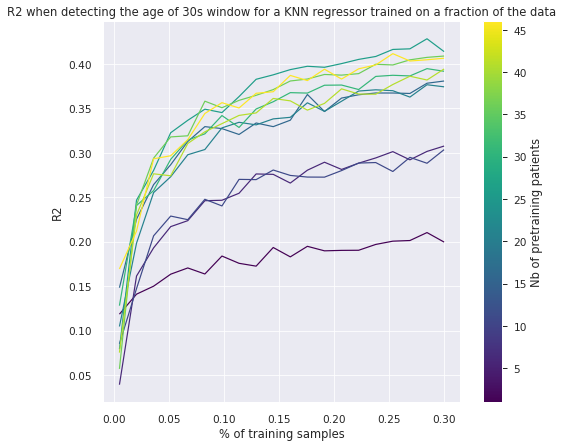

In [33]:
plot_knn(embds_list, ages, cmap_values=nb_subjects, colorbar_title='Nb of pretraining patients', regression=True, verbose=1)
plt.savefig('img/age_detection.png', dpi=200, bbox_inches='tight', pad_inches=0, facecolor=(1,1,1,0))
plt.title('R2 when detecting the age of 30s window for a KNN regressor trained on a fraction of the data');

# Downstream task

In [22]:
acc_list_all = np.load('acc_list_all.npy')

In [23]:
lr = 5e-4
batch_size = 16
max_nb_epochs = 40
early_stopping_patience = 5

acc_list_all = []
for _ in range(5):
    acc_list = []
    for network in networks:
        classifier_net = ClassifierNet(network.encoder, p_dropout=0.2)
        _, acc = train_and_test(classifier_net, full_train_set, valid_set, test_set=test_set, lr=lr, batch_size=batch_size,
                                max_nb_epochs=max_nb_epochs, early_stopping_patience=early_stopping_patience, train_what="last")
        acc_list.append(acc)
    acc_list_all.append(acc_list)

  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.3702        1.3004       0.7063           0.4641        1.2065  15.8115


      2           0.3823        1.2955       0.7189           0.4786        1.1919  15.8304


      3           0.3844        1.2932       0.7119           0.4829        1.1999  15.7973


      4           0.3842        1.2924       0.7123           0.4488        1.1931  16.2503


      5           0.3878        1.2909       0.7229           0.4773        1.1860  16.5815


      6           0.3889        1.2893       0.7133           0.4650        1.1924  16.5914


      7           0.3911        1.2888       0.7091           0.4766        1.1975  16.3013


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.3752        1.2905       0.7109           0.4880        1.2039  16.4218


      2           0.4049        1.2750       0.7154           0.5143        1.1997  17.1684


      3           0.4077        1.2717       0.7094           0.5058        1.2060  16.9848


      4           0.4112        1.2686       0.7149           0.4413        1.1895  16.3282


      5           0.4133        1.2669       0.7132           0.5253        1.2025  16.4024


      6           0.4167        1.2671       0.7132           0.5222        1.2004  16.4901


      7           0.4195        1.2643       0.7219           0.4928        1.1906  17.0667


      8           0.4208        1.2621       0.6922           0.5155        1.2172  16.9498


      9           0.4211        1.2629       0.7110           0.5242        1.2017  17.0098


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4497        1.2564       0.7261           0.4598        1.1746  16.3878


      2           0.4685        1.2454       0.7291           0.4846        1.1718  16.4046


      3           0.4734        1.2431       0.7312           0.4839        1.1700  17.6194


      4           0.4741        1.2418       0.7318           0.4815        1.1697  17.6292


      5           0.4738        1.2416       0.7194           0.4757        1.1803  17.4737


      6           0.4740        1.2408       0.7275           0.4688        1.1738  17.1534


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4389        1.2432       0.7057           0.5278        1.1980  16.5951


      2           0.4540        1.2321       0.7290           0.4963        1.1716  16.8304


      3           0.4561        1.2285       0.7161           0.5299        1.1908  16.9391


      4           0.4591        1.2260       0.7224           0.5326        1.1822  17.0557


      5           0.4621        1.2235       0.7260           0.5265        1.1789  17.6670


      6           0.4650        1.2217       0.7196           0.5347        1.1843  17.5913


      7           0.4670        1.2195       0.7146           0.5261        1.1908  17.5231


      8           0.4723        1.2166       0.7169           0.5331        1.1940  16.9896


      9           0.4734        1.2148       0.7146           0.5244        1.1883  16.6684


     10           0.4753        1.2140       0.7318           0.5344        1.1726  16.8427


     11           0.4756        1.2135       0.7271           0.5382        1.1873  16.9176


     12           0.4792        1.2125       0.7366           0.5392        1.1695  17.3726


     13           0.4801        1.2112       0.7487           0.5578        1.1653  17.1736


     14           0.4810        1.2105       0.7271           0.5335        1.1715  16.9814


     15           0.4815        1.2101       0.7300           0.5430        1.1766  16.8842


     16           0.4827        1.2091       0.7373           0.5496        1.1695  17.3573


     17           0.4829        1.2094       0.7398           0.5309        1.1618  16.8678


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4500        1.2354       0.7340           0.5257        1.1716  17.3205


      2           0.4642        1.2240       0.7221           0.5298        1.1795  17.5507


      3           0.4677        1.2217       0.7232           0.5394        1.1794  16.8197


      4           0.4706        1.2192       0.7352           0.5327        1.1643  16.7383


      5           0.4721        1.2186       0.7298           0.5383        1.1730  17.0376


      6           0.4749        1.2165       0.7332           0.5466        1.1713  17.4810


      7           0.4740        1.2168       0.7051           0.5305        1.1946  17.2688


      8           0.4786        1.2142       0.7361           0.5413        1.1666  16.7026


      9           0.4787        1.2138       0.7317           0.5366        1.1706  17.1462


     10           0.4804        1.2135       0.7361           0.5396        1.1684  16.4003


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.5604        1.1962       0.7384           0.6409        1.1663  16.7895


      2           0.5780        1.1860       0.7660           0.6617        1.1364  16.9611


      3           0.5837        1.1807       0.7618           0.6458        1.1442  16.9185


      4           0.5901        1.1777       0.7296           0.6327        1.1699  17.6219


      5           0.5933        1.1756       0.7449           0.6272        1.1589  16.7680


      6           0.5992        1.1726       0.7616           0.6492        1.1410  16.2570


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4964        1.2303       0.7539           0.5613        1.1516  16.2198


      2           0.5533        1.2057       0.7484           0.5802        1.1627  16.7449


      3           0.5606        1.2010       0.7483           0.6267        1.1617  17.1987


      4           0.5627        1.1977       0.7453           0.6642        1.1621  17.7596


      5           0.5638        1.1951       0.7636           0.6453        1.1489  17.0596


      6           0.5714        1.1924       0.7523           0.6288        1.1519  16.8502


      7           0.5693        1.1917       0.7861           0.6686        1.1352  17.4386


      8           0.5777        1.1888       0.7646           0.6613        1.1435  17.0504


      9           0.5756        1.1880       0.7459           0.6418        1.1577  17.3917


     10           0.5762        1.1868       0.7639           0.6724        1.1528  16.4533


     11           0.5812        1.1852       0.7441           0.6459        1.1579  16.3519


     12           0.5834        1.1851       0.7604           0.6637        1.1469  17.2381


     13           0.5848        1.1837       0.7367           0.6605        1.1705  17.2430


     14           0.5844        1.1834       0.7651           0.6954        1.1473  15.4648


     15           0.5854        1.1829       0.7843           0.6792        1.1352  16.6495


     16           0.5837        1.1813       0.7684           0.6487        1.1384  16.7766


     17           0.5889        1.1815       0.7289           0.6792        1.1823  17.2391


     18           0.5861        1.1834       0.7604           0.6888        1.1555  17.4357


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.5396        1.2117       0.7718           0.6491        1.1372  17.4330


      2           0.5573        1.1993       0.7204           0.5982        1.1840  16.4904


      3           0.5667        1.1917       0.7733           0.6260        1.1372  16.8605


      4           0.5710        1.1869       0.7355           0.6230        1.1770  17.4678


      5           0.5766        1.1834       0.7691           0.6524        1.1436  17.0426


      6           0.5797        1.1818       0.7273           0.6298        1.1739  17.0464


      7           0.5837        1.1788       0.7525           0.6173        1.1525  17.6553


      8           0.5870        1.1778       0.7639           0.6635        1.1489  17.6653


      9           0.5908        1.1750       0.7808           0.6716        1.1281  16.8636


     10           0.5911        1.1753       0.7380           0.6576        1.1665  16.3868


     11           0.5918        1.1736       0.7604           0.6545        1.1439  16.6453


     12           0.5905        1.1743       0.7847           0.6540        1.1224  17.0236


     13           0.5924        1.1732       0.7804           0.6185        1.1262  17.1876


     14           0.5936        1.1724       0.7777           0.6755        1.1318  17.2946


     15           0.5957        1.1711       0.7624           0.6640        1.1450  17.2244


     16           0.5959        1.1724       0.7679           0.6661        1.1377  16.7437


     17           0.5970        1.1715       0.7511           0.6602        1.1525  16.9035


     18           0.5937        1.1724       0.7735           0.6377        1.1295  16.7625


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.5189        1.2231       0.7319           0.6097        1.1833  16.9138


      2           0.5494        1.2058       0.7373           0.6268        1.1717  17.3271


      3           0.5591        1.2027       0.7594           0.6275        1.1418  16.6526


      4           0.5635        1.1990       0.7608           0.6462        1.1464  16.2346


      5           0.5675        1.1967       0.7469           0.5869        1.1555  17.0013


      6           0.5723        1.1953       0.7547           0.5997        1.1531  17.5316


      7           0.5714        1.1937       0.7558           0.5987        1.1539  17.7852


      8           0.5767        1.1919       0.7607           0.6421        1.1431  17.7477


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4701        1.2391       0.7301           0.4794        1.1724  16.5479


      2           0.4810        1.2333       0.7311           0.4810        1.1707  17.1156


      3           0.5003        1.2264       0.7595           0.6069        1.1481  17.2584


      4           0.5697        1.1902       0.7693           0.6357        1.1323  17.9948


      5           0.5921        1.1797       0.7569           0.6265        1.1421  17.3620


      6           0.5913        1.1780       0.7357           0.6091        1.1621  16.7970


      7           0.5941        1.1757       0.7444           0.6503        1.1553  17.0067


      8           0.5944        1.1748       0.7306           0.6610        1.1685  16.5964


      9           0.5991        1.1745       0.7470           0.6473        1.1486  17.0337


     10           0.5985        1.1731       0.7514           0.6776        1.1514  17.0891


     11           0.6044        1.1714       0.7552           0.6443        1.1450  17.7296


     12           0.6017        1.1713       0.7769           0.6951        1.1365  16.7224


     13           0.6031        1.1713       0.7714           0.6748        1.1292  17.2501


     14           0.6039        1.1710       0.7728           0.6636        1.1281  17.2391


     15           0.6017        1.1706       0.7470           0.6737        1.1560  17.3156


     16           0.6079        1.1692       0.7657           0.6246        1.1388  16.8788


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.3645        1.3023       0.7052           0.4501        1.2073  16.8587


      2           0.3812        1.2950       0.7143           0.4592        1.1909  17.2742


      3           0.3852        1.2927       0.7115           0.4742        1.1997  17.1428


      4           0.3880        1.2915       0.7164           0.4741        1.1984  17.5655


      5           0.3892        1.2903       0.7094           0.4358        1.1886  16.7475


      6           0.3878        1.2909       0.7130           0.4574        1.1916  16.7418


      7           0.3895        1.2893       0.7219           0.4784        1.1875  17.1338


      8           0.3912        1.2889       0.7046           0.4380        1.2005  16.5373


      9           0.3915        1.2882       0.6915           0.4550        1.2190  17.5661


     10           0.3917        1.2873       0.7097           0.4431        1.1920  17.1120


     11           0.3923        1.2871       0.7112           0.4474        1.1951  17.3343


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4506        1.2709       0.7079           0.4454        1.1937  17.3947


      2           0.4664        1.2609       0.7281           0.4918        1.1750  17.1675


      3           0.4663        1.2601       0.7281           0.4919        1.1778  16.9309


      4           0.4669        1.2562       0.7190           0.4562        1.1844  16.7751


      5           0.4701        1.2547       0.7248           0.4858        1.1810  16.6029


      6           0.4692        1.2541       0.7252           0.4713        1.1774  17.6432


      7           0.4718        1.2537       0.7312           0.5236        1.1769  16.9224


      8           0.4720        1.2534       0.7311           0.4952        1.1730  17.2470


      9           0.4714        1.2511       0.7283           0.5101        1.1790  16.0888


     10           0.5085        1.2383       0.7554           0.6084        1.1577  17.1583


     11           0.5251        1.2329       0.7397           0.6301        1.1798  17.1500


     12           0.5272        1.2298       0.7345           0.5750        1.1734  16.0298


     13           0.5288        1.2292       0.7412           0.6390        1.1761  16.6775


     14           0.5273        1.2281       0.7498           0.6018        1.1616  17.1322


     15           0.5336        1.2251       0.7459           0.6078        1.1598  17.5009


     16           0.5348        1.2268       0.7037           0.6173        1.2063  17.6084


     17           0.5326        1.2250       0.7068           0.5695        1.1955  16.0832


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4271        1.2499       0.7294           0.4890        1.1700  17.6807


      2           0.4453        1.2404       0.7274           0.4860        1.1725  17.3544


      3           0.4453        1.2390       0.7276           0.5026        1.1706  17.0795


      4           0.4509        1.2357       0.7274           0.5176        1.1717  16.9959


      5           0.4525        1.2345       0.7300           0.5073        1.1671  17.2977


      6           0.4530        1.2334       0.7323           0.4973        1.1648  17.3456


      7           0.4545        1.2315       0.7320           0.4978        1.1653  17.2955


      8           0.4536        1.2324       0.7325           0.4855        1.1652  17.2405


      9           0.4561        1.2300       0.7331           0.5233        1.1668  17.2041


     10           0.4552        1.2304       0.7369           0.5034        1.1613  17.4869


     11           0.4574        1.2303       0.7337           0.4948        1.1641  17.3657


     12           0.4605        1.2281       0.7245           0.4660        1.1719  16.7937


     13           0.4591        1.2293       0.7327           0.4982        1.1648  17.6124


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.3973        1.4384       0.7515           0.6050        1.1671  17.2016


      2           0.5469        1.2081       0.7619           0.6188        1.1410  17.0576


      3           0.5575        1.2006       0.7379           0.6116        1.1654  17.4617


      4           0.5626        1.1980       0.7363           0.5977        1.1656  17.0490


      5           0.5691        1.1927       0.7425           0.6461        1.1639  17.2970


      6           0.5723        1.1902       0.7176           0.5739        1.1813  16.9534


      7           0.5758        1.1880       0.7395           0.6395        1.1622  17.0974


      8           0.5809        1.1857       0.7262           0.6289        1.1769  17.0961


      9           0.5835        1.1842       0.7389           0.6393        1.1633  16.5427


     10           0.5848        1.1819       0.7457           0.6534        1.1608  17.7173


     11           0.5859        1.1807       0.7413           0.6545        1.1649  17.2435


     12           0.5885        1.1797       0.7648           0.6628        1.1428  17.6377


     13           0.5874        1.1803       0.7512           0.6382        1.1525  16.9479


     14           0.5927        1.1781       0.7490           0.6293        1.1567  17.6388


     15           0.5960        1.1774       0.7454           0.6508        1.1574  16.5673


     16           0.5940        1.1771       0.7327           0.6174        1.1674  16.9479


     17           0.5952        1.1766       0.7636           0.6661        1.1466  17.0808


     18           0.5966        1.1772       0.7464           0.6608        1.1577  17.0724


     19           0.5921        1.1775       0.7405           0.6605        1.1634  16.9538


     20           0.5973        1.1772       0.7570           0.6569        1.1494  17.4017


     21           0.5966        1.1756       0.7233           0.6395        1.1811  16.7937


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4513        1.2346       0.7362           0.5304        1.1694  16.7386


      2           0.4622        1.2257       0.7245           0.5321        1.1778  16.9172


      3           0.4685        1.2222       0.7307           0.5216        1.1728  17.5253


      4           0.4700        1.2190       0.7238           0.5263        1.1760  17.6253


      5           0.4743        1.2172       0.7395           0.5536        1.1682  17.8548


      6           0.4740        1.2162       0.7409           0.5332        1.1592  16.2318


      7           0.4764        1.2152       0.6924           0.5182        1.2128  17.0507


      8           0.4759        1.2146       0.7155           0.5374        1.1859  16.5916


      9           0.4779        1.2131       0.7171           0.5369        1.1872  17.2189


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4678        1.2174       0.7248           0.5305        1.1781  17.2124


      2           0.4801        1.2086       0.7449           0.5409        1.1572  17.3376


      3           0.4858        1.2055       0.6775           0.5167        1.2211  16.7454


      4           0.4906        1.2015       0.7339           0.5388        1.1657  17.2817


      5           0.4934        1.2004       0.7026           0.5303        1.1959  17.0342


      6           0.4942        1.1992       0.7265           0.5402        1.1715  17.0438


      7           0.4976        1.1976       0.7428           0.5453        1.1581  17.8061


      8           0.4951        1.1981       0.7231           0.5434        1.1780  17.5483


      9           0.4999        1.1960       0.7307           0.5391        1.1702  16.6492


     10           0.4983        1.1963       0.7176           0.5363        1.1795  16.3248


     11           0.5004        1.1951       0.7177           0.5375        1.1797  16.9999


     12           0.5002        1.1947       0.7390           0.5467        1.1633  17.3448


     13           0.5002        1.1949       0.7275           0.5465        1.1760  17.0654


     14           0.5023        1.1949       0.7158           0.5350        1.1818  16.7460


     15           0.5003        1.1949       0.7128           0.5322        1.1845  17.5263


     16           0.5028        1.1942       0.7233           0.5419        1.1766  16.2887


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4299        1.2472       0.7166           0.5253        1.1907  16.7650


      2           0.4492        1.2350       0.7300           0.4892        1.1748  17.1795


      3           0.4596        1.2278       0.7232           0.5317        1.1862  17.5322


      4           0.4603        1.2263       0.7341           0.5263        1.1676  16.9824


      5           0.4629        1.2242       0.7356           0.5317        1.1672  16.8349


      6           0.4648        1.2229       0.7517           0.5226        1.1643  16.0562


      7           0.4663        1.2220       0.7095           0.5278        1.1990  16.7294


      8           0.4672        1.2206       0.7271           0.5323        1.1749  17.4692


      9           0.4694        1.2195       0.6913           0.5220        1.2068  17.6607


     10           0.4710        1.2194       0.7115           0.5314        1.1907  17.7134


     11           0.4709        1.2181       0.7428           0.5404        1.1645  17.3913


     12           0.4710        1.2183       0.7320           0.5370        1.1745  17.4187


     13           0.4717        1.2170       0.7413           0.5553        1.1691  17.4455


     14           0.4759        1.2149       0.7210           0.5461        1.1798  16.8359


     15           0.4750        1.2144       0.7253           0.5337        1.1770  17.5425


     16           0.4746        1.2145       0.7330           0.5331        1.1715  17.5464


     17           0.4785        1.2129       0.6872           0.5061        1.2118  17.1900


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.5148        1.2246       0.7543           0.5735        1.1533  16.8777


      2           0.5606        1.1946       0.7066           0.6073        1.1945  17.6421


      3           0.5685        1.1901       0.7722           0.6373        1.1443  16.9720


      4           0.5737        1.1847       0.7456           0.6664        1.1636  16.9355


      5           0.5784        1.1809       0.7661           0.6525        1.1480  17.0803


      6           0.5819        1.1783       0.7766           0.6211        1.1306  16.9248


      7           0.5841        1.1773       0.7656           0.6524        1.1498  17.5408


      8           0.5879        1.1752       0.7455           0.6750        1.1628  17.3112


      9           0.5921        1.1735       0.7592           0.6675        1.1522  17.1417


     10           0.5919        1.1733       0.7843           0.6351        1.1261  17.4113


     11           0.5925        1.1732       0.7685           0.6490        1.1360  17.6011


     12           0.5951        1.1729       0.7900           0.6763        1.1213  17.8754


     13           0.5937        1.1727       0.7814           0.6843        1.1259  17.5789


     14           0.5993        1.1707       0.7637           0.6409        1.1414  17.7819


     15           0.6004        1.1712       0.7786           0.6454        1.1299  17.3512


     16           0.5955        1.1714       0.7614           0.6223        1.1438  17.0248


     17           0.5960        1.1703       0.7723           0.6835        1.1353  17.3468


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.5146        1.2245       0.7462           0.6230        1.1644  16.9825


      2           0.5540        1.2053       0.7447           0.6425        1.1641  17.3882


      3           0.5582        1.2014       0.7511           0.5859        1.1530  17.5002


      4           0.5657        1.1980       0.7517           0.5960        1.1580  16.9102


      5           0.5682        1.1962       0.7651           0.6307        1.1401  17.1593


      6           0.5739        1.1941       0.7401           0.6043        1.1680  17.6266


      7           0.5765        1.1926       0.7755           0.6677        1.1331  17.7350


      8           0.5780        1.1925       0.7550           0.5992        1.1452  17.2784


      9           0.5777        1.1918       0.7614           0.6473        1.1470  16.8711


     10           0.5779        1.1914       0.7371           0.6400        1.1706  17.2270


     11           0.5816        1.1899       0.7479           0.6474        1.1599  17.2341


     12           0.5828        1.1884       0.7746           0.6704        1.1339  16.8913


     13           0.5833        1.1886       0.7672           0.6315        1.1340  17.2542


     14           0.5811        1.1887       0.7499           0.6417        1.1554  17.3007


     15           0.5843        1.1873       0.7536           0.6179        1.1490  17.0732


     16           0.5843        1.1862       0.7629           0.6590        1.1438  17.5750


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.5521        1.2019       0.7521           0.6117        1.1506  16.0897


      2           0.5802        1.1857       0.7545           0.6156        1.1475  17.0585


      3           0.5860        1.1812       0.7608           0.6001        1.1399  17.3770


      4           0.5873        1.1789       0.7263           0.6523        1.1742  17.6413


      5           0.5934        1.1774       0.7566           0.6522        1.1440  17.4597


      6           0.5921        1.1765       0.7557           0.6304        1.1463  17.5180


      7           0.5969        1.1749       0.7577           0.6527        1.1414  17.2246


      8           0.5963        1.1761       0.7569           0.6662        1.1432  16.9150


      9           0.5998        1.1738       0.7488           0.6572        1.1496  16.5287


     10           0.5974        1.1728       0.7546           0.6789        1.1498  16.5394


     11           0.5950        1.1727       0.7666           0.6713        1.1366  17.6502


     12           0.6027        1.1708       0.7579           0.6727        1.1480  16.9241


     13           0.6032        1.1708       0.7482           0.6188        1.1535  17.6883


     14           0.6017        1.1698       0.7647           0.6614        1.1369  16.9515


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.3686        1.3016       0.7101           0.4563        1.1953  17.1481


      2           0.3796        1.2959       0.7157           0.4596        1.1932  16.8899


      3           0.3833        1.2933       0.7167           0.4682        1.1914  17.3084


      4           0.3868        1.2922       0.6986           0.4027        1.1962  16.7794


      5           0.3880        1.2906       0.7210           0.4827        1.1877  17.5482


      6           0.3879        1.2900       0.7071           0.4707        1.2111  17.6227


      7           0.3909        1.2892       0.7185           0.4836        1.1951  17.9637


      8           0.3893        1.2896       0.7226           0.4950        1.1916  17.4450


      9           0.3903        1.2889       0.7163           0.4761        1.1895  17.7936


     10           0.3906        1.2883       0.7227           0.4952        1.1934  17.5067


     11           0.3937        1.2868       0.7189           0.4659        1.1873  17.1071


     12           0.3931        1.2873       0.7096           0.4406        1.1930  16.1404


     13           0.3942        1.2865       0.7098           0.4337        1.1909  16.7001


     14           0.3950        1.2856       0.7120           0.4524        1.1936  18.0875


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4678        1.2649       0.7382           0.6258        1.1821  17.1597


      2           0.5068        1.2474       0.7340           0.5483        1.1668  16.9871


      3           0.5126        1.2432       0.7373           0.5340        1.1709  17.5736


      4           0.5142        1.2412       0.7228           0.5907        1.1887  17.0134


      5           0.5127        1.2396       0.7462           0.6300        1.1711  17.3443


      6           0.5225        1.2363       0.7432           0.5850        1.1694  17.1703


      7           0.5232        1.2356       0.7174           0.6199        1.1928  17.3897


      8           0.5265        1.2330       0.7504           0.6113        1.1605  17.5140


      9           0.5226        1.2338       0.7328           0.6244        1.1796  17.7847


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4090        1.2577       0.7304           0.4984        1.1713  16.7081


      2           0.4402        1.2417       0.7100           0.4467        1.1884  16.9589


      3           0.4476        1.2382       0.7205           0.5205        1.1792  17.2843


      4           0.4499        1.2371       0.7293           0.4927        1.1669  17.5589


      5           0.4534        1.2339       0.7285           0.4817        1.1696  17.4336


      6           0.4544        1.2335       0.7212           0.4644        1.1757  17.1359


      7           0.4548        1.2324       0.7215           0.5120        1.1751  17.1445


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4366        1.2431       0.7254           0.5264        1.1779  16.9148


      2           0.4531        1.2320       0.7284           0.5066        1.1729  17.2164


      3           0.4562        1.2281       0.6942           0.5209        1.2045  17.9097


      4           0.4600        1.2242       0.7142           0.5261        1.1863  17.3385


      5           0.4644        1.2215       0.7188           0.5355        1.1871  17.2153


      6           0.4675        1.2189       0.7135           0.5368        1.1867  17.0752


      7           0.4716        1.2163       0.7383           0.5158        1.1748  17.2236


      8           0.4763        1.2140       0.7371           0.5311        1.1761  16.9332


      9           0.4772        1.2132       0.7407           0.5351        1.1679  17.6971


     10           0.4771        1.2126       0.7356           0.5221        1.1739  17.8443


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4451        1.2361       0.7246           0.5246        1.1793  16.7441


      2           0.4655        1.2239       0.7309           0.5291        1.1703  17.2108


      3           0.4686        1.2214       0.7168           0.5381        1.1896  17.2866


      4           0.4705        1.2212       0.7254           0.5488        1.1770  16.9879


      5           0.4722        1.2185       0.7225           0.5252        1.1819  17.0168


      6           0.4752        1.2165       0.7235           0.5414        1.1770  16.8422


      7           0.4764        1.2165       0.7431           0.5474        1.1645  17.5580


      8           0.4738        1.2163       0.7282           0.5386        1.1731  17.4287


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.5629        1.1957       0.7666           0.5953        1.1351  16.9405


      2           0.5779        1.1847       0.7672           0.6784        1.1378  17.7606


      3           0.5896        1.1791       0.7632           0.6274        1.1390  16.8963


      4           0.5951        1.1763       0.7582           0.6439        1.1443  17.8229


      5           0.5958        1.1744       0.7286           0.6765        1.1758  17.5839


      6           0.5966        1.1723       0.7336           0.6310        1.1665  16.5324


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.5244        1.2217       0.7392           0.5120        1.1645  17.6313


      2           0.5495        1.2070       0.7547           0.6263        1.1600  17.3578


      3           0.5619        1.2002       0.7540           0.6400        1.1550  17.1297


      4           0.5667        1.1956       0.7569           0.6465        1.1528  17.4376


      5           0.5714        1.1924       0.7691           0.6280        1.1363  17.4363


      6           0.5736        1.1901       0.7472           0.6426        1.1582  16.8599


      7           0.5727        1.1900       0.7518           0.6504        1.1529  17.4383


      8           0.5774        1.1881       0.7634           0.6451        1.1420  17.2537


      9           0.5782        1.1868       0.7788           0.6493        1.1370  17.8115


     10           0.5810        1.1862       0.7417           0.6705        1.1621  17.0705


     11           0.5841        1.1853       0.7809           0.6756        1.1342  16.7199


     12           0.5849        1.1842       0.7801           0.6704        1.1291  17.4241


     13           0.5815        1.1828       0.7322           0.6338        1.1693  17.2920


     14           0.5851        1.1832       0.7664           0.6701        1.1434  16.7737


     15           0.5872        1.1817       0.7687           0.6994        1.1537  18.9042


     16           0.5887        1.1816       0.7449           0.6701        1.1685  18.2679


     17           0.5875        1.1810       0.7746           0.6856        1.1358  18.4573


     18           0.5868        1.1810       0.7505           0.6434        1.1616  17.8082


     19           0.5880        1.1805       0.7775           0.6716        1.1363  17.3942


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4923        1.2314       0.7151           0.6090        1.1887  16.6433


      2           0.5550        1.1984       0.7082           0.6315        1.1953  16.9708


      3           0.5659        1.1903       0.6993           0.6295        1.2019  16.8993


      4           0.5722        1.1865       0.7692           0.6466        1.1429  17.8850


      5           0.5798        1.1812       0.7477           0.6468        1.1598  17.1421


      6           0.5811        1.1783       0.7515           0.6144        1.1578  17.7807


      7           0.5868        1.1781       0.7603           0.6751        1.1456  16.9940


      8           0.5900        1.1753       0.7733           0.6461        1.1387  17.7719


      9           0.5907        1.1746       0.7553           0.6361        1.1488  17.2543


     10           0.5917        1.1744       0.7794           0.6275        1.1256  16.8973


     11           0.5942        1.1728       0.7763           0.6293        1.1296  16.6505


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4700        1.2422       0.7346           0.5830        1.1913  17.5624


      2           0.5505        1.2073       0.7552           0.6048        1.1493  16.1577


      3           0.5609        1.2014       0.7564           0.6438        1.1506  17.6489


      4           0.5610        1.1985       0.7608           0.6184        1.1475  17.7878


      5           0.5704        1.1961       0.7599           0.5997        1.1444  17.2283


      6           0.5722        1.1938       0.7460           0.6184        1.1589  16.8376


      7           0.5745        1.1926       0.7519           0.6322        1.1581  17.1984


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4711        1.2389       0.7301           0.4742        1.1713  16.8910


      2           0.4961        1.2285       0.6938           0.6324        1.2048  17.7425


      3           0.5828        1.1852       0.7612           0.6517        1.1404  17.0185


      4           0.5872        1.1804       0.7498           0.6507        1.1503  18.0004


      5           0.5922        1.1776       0.7391           0.6688        1.1622  17.8134


      6           0.5936        1.1765       0.7433           0.6440        1.1549  17.7968


      7           0.5960        1.1762       0.7408           0.6767        1.1579  17.0308


      8           0.5973        1.1746       0.7835           0.6730        1.1252  17.1874


      9           0.5993        1.1731       0.7689           0.6658        1.1329  16.6381


     10           0.6023        1.1716       0.7797           0.6612        1.1277  17.0087


     11           0.6014        1.1715       0.7435           0.6567        1.1537  17.7926


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.3719        1.2997       0.7069           0.4439        1.2028  16.4762


      2           0.3825        1.2945       0.7020           0.4675        1.2156  17.1994


      3           0.3866        1.2923       0.7174           0.4627        1.1890  17.4127


      4           0.3866        1.2921       0.7127           0.4412        1.1891  16.9721


      5           0.3891        1.2905       0.7163           0.4910        1.1993  17.7399


      6           0.3870        1.2907       0.7077           0.4967        1.2077  17.2388


      7           0.3899        1.2897       0.7272           0.4968        1.1829  17.4185


      8           0.3896        1.2887       0.7130           0.4648        1.1923  17.2071


      9           0.3903        1.2890       0.7112           0.4684        1.1958  17.3662


     10           0.3904        1.2885       0.7097           0.4354        1.1907  17.5702


     11           0.3930        1.2870       0.7086           0.4372        1.1956  17.6129


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.2931        1.5025       0.3811           0.3367        1.5237  16.0079


      2           0.3033        1.5005       0.3794           0.3120        1.5255  16.6714


      3           0.3028        1.4999       0.3756           0.2947        1.5291  16.9002


      4           0.3021        1.4997       0.3778           0.3048        1.5265  17.6711


      5           0.3030        1.5003       0.3808           0.3255        1.5235  17.1007


      6           0.3005        1.5002       0.3808           0.3426        1.5233  16.9977


      7           0.3047        1.4999       0.3804           0.3162        1.5246  17.3794


      8           0.3051        1.5000       0.3653           0.2563        1.5387  17.6717


      9           0.3032        1.5004       0.3704           0.2741        1.5337  17.4529


     10           0.3029        1.4994       0.3802           0.3244        1.5236  17.7440


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.3796        1.2693       0.7199           0.4995        1.1911  16.9835


      2           0.4384        1.2437       0.7305           0.4960        1.1712  17.6850


      3           0.4462        1.2383       0.7311           0.4948        1.1683  17.8956


      4           0.4467        1.2381       0.7291           0.5081        1.1708  18.6268


      5           0.4512        1.2356       0.7298           0.4869        1.1685  18.8272


      6           0.4511        1.2357       0.7322           0.5116        1.1668  18.0619


      7           0.4535        1.2334       0.7269           0.4952        1.1694  17.6522


      8           0.4556        1.2316       0.7321           0.5003        1.1652  17.6072


      9           0.4576        1.2312       0.7344           0.4902        1.1638  18.1117


     10           0.4570        1.2311       0.7319           0.5143        1.1674  17.5682


     11           0.4569        1.2312       0.7324           0.5121        1.1645  16.8023


     12           0.4600        1.2288       0.7442           0.5178        1.1611  17.0550


     13           0.4586        1.2297       0.7417           0.5167        1.1656  17.7983


     14           0.4598        1.2287       0.7379           0.4956        1.1625  18.2343


     15           0.4596        1.2297       0.7320           0.4801        1.1678  17.6118


     16           0.4591        1.2285       0.7339           0.5268        1.1660  16.6085


     17           0.4586        1.2284       0.7345           0.5141        1.1633  17.6930


     18           0.4619        1.2284       0.7369           0.5037        1.1651  17.5180


     19           0.4638        1.2261       0.7354           0.4753        1.1660  17.7960


     20           0.4611        1.2275       0.7356           0.5010        1.1635  17.5673


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4618        1.2472       0.7231           0.4773        1.1799  17.7143


      2           0.4761        1.2390       0.7180           0.4579        1.1844  17.9355


      3           0.4795        1.2354       0.7213           0.4577        1.1794  16.5757


      4           0.4862        1.2335       0.7264           0.4765        1.1765  16.7416


      5           0.4813        1.2327       0.7307           0.5156        1.1834  18.2009


      6           0.4871        1.2307       0.7329           0.5009        1.1713  17.3897


      7           0.4864        1.2305       0.7311           0.4983        1.1825  17.8286


      8           0.5396        1.2070       0.7483           0.6317        1.1597  17.2993


      9           0.5697        1.1917       0.7272           0.6100        1.1776  17.0955


     10           0.5711        1.1913       0.7372           0.6398        1.1649  17.6651


     11           0.5766        1.1882       0.7622           0.6683        1.1433  18.0914


     12           0.5788        1.1866       0.7523           0.6510        1.1585  17.6053


     13           0.5833        1.1856       0.7224           0.6563        1.1767  17.4642


     14           0.5826        1.1824       0.7455           0.6719        1.1614  17.9882


     15           0.5862        1.1813       0.7440           0.6445        1.1608  17.8402


     16           0.5879        1.1809       0.7831           0.6857        1.1351  17.6361


     17           0.5902        1.1792       0.7581           0.6629        1.1467  17.4899


     18           0.5910        1.1784       0.7657           0.6743        1.1417  18.0085


     19           0.5925        1.1770       0.7850           0.6742        1.1324  17.8362


     20           0.5919        1.1785       0.7642           0.6625        1.1412  18.5001


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4483        1.2353       0.7279           0.5259        1.1750  17.3139


      2           0.4614        1.2259       0.7290           0.5324        1.1745  17.0373


      3           0.4677        1.2225       0.7339           0.5281        1.1677  16.9547


      4           0.4700        1.2203       0.7332           0.5346        1.1689  18.0853


      5           0.4726        1.2179       0.7494           0.5394        1.1536  17.1421


      6           0.4714        1.2183       0.7348           0.5287        1.1660  17.4090


      7           0.4750        1.2157       0.7201           0.5382        1.1812  17.5274


      8           0.4763        1.2159       0.7315           0.5194        1.1744  18.0086


      9           0.4800        1.2138       0.6695           0.5134        1.2327  17.5688


     10           0.4797        1.2143       0.7512           0.5564        1.1625  15.9217


     11           0.4793        1.2131       0.7347           0.5247        1.1675  16.8792


     12           0.4828        1.2106       0.7318           0.5325        1.1663  17.2116


     13           0.4802        1.2111       0.7384           0.5214        1.1628  17.6811


     14           0.4818        1.2109       0.7210           0.5327        1.1835  17.3772


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.5565        1.1975       0.7287           0.6526        1.1774  16.7930


      2           0.5801        1.1841       0.7726           0.6636        1.1304  16.8316


      3           0.5902        1.1794       0.7689           0.6573        1.1341  17.4169


      4           0.5940        1.1755       0.7627           0.6700        1.1399  17.4986


      5           0.5973        1.1740       0.7419           0.6617        1.1646  17.5301


      6           0.6019        1.1715       0.7543           0.6807        1.1468  17.3192


      7           0.6002        1.1714       0.7143           0.6443        1.1819  17.4477


      8           0.5983        1.1709       0.7441           0.6660        1.1572  17.6173


      9           0.6017        1.1699       0.7713           0.6819        1.1324  17.1311


     10           0.6062        1.1685       0.7599           0.6609        1.1449  17.2254


     11           0.6087        1.1676       0.7308           0.6226        1.1699  17.4738


     12           0.6038        1.1688       0.7447           0.6096        1.1570  17.4237


     13           0.6097        1.1677       0.7456           0.6772        1.1546  17.2761


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.5268        1.2213       0.7296           0.5931        1.1815  16.8388


      2           0.5520        1.2077       0.7463           0.6125        1.1630  16.8309


      3           0.5626        1.2001       0.7547           0.5708        1.1480  17.5279


      4           0.5683        1.1967       0.7494           0.6277        1.1622  17.3582


      5           0.5710        1.1924       0.7489           0.6544        1.1633  17.1125


      6           0.5743        1.1914       0.7556           0.6706        1.1577  17.1462


      7           0.5751        1.1899       0.7628           0.6422        1.1508  17.1535


      8           0.5762        1.1870       0.7676           0.6397        1.1390  16.6704


      9           0.5758        1.1876       0.7548           0.6465        1.1537  17.8291


     10           0.5798        1.1873       0.7694           0.6631        1.1378  17.4040


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4643        1.2464       0.7279           0.4668        1.1738  15.9320


      2           0.4746        1.2362       0.7406           0.5146        1.1641  17.9098


      3           0.4899        1.2296       0.7468           0.5221        1.1598  17.2320


      4           0.5531        1.1959       0.7495           0.6736        1.1592  16.3716


      5           0.5778        1.1849       0.7803           0.6551        1.1339  17.5632


      6           0.5810        1.1823       0.7411           0.6676        1.1647  17.4508


      7           0.5802        1.1818       0.7559           0.6686        1.1539  17.2906


      8           0.5829        1.1788       0.7372           0.6614        1.1652  17.9297


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4297        1.2445       0.7276           0.5011        1.1774  17.2434


      2           0.4550        1.2322       0.7185           0.5209        1.1884  17.0029


      3           0.4555        1.2302       0.7270           0.4985        1.1824  17.0739


      4           0.4588        1.2281       0.7047           0.5174        1.1987  17.4507


      5           0.4639        1.2248       0.7330           0.5158        1.1708  17.3421


      6           0.4659        1.2235       0.7206           0.5120        1.1868  17.4240


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.5511        1.2001       0.7498           0.6259        1.1542  17.3118


      2           0.5767        1.1867       0.7630           0.6629        1.1409  17.6079


      3           0.5851        1.1832       0.7263           0.6032        1.1699  16.9279


      4           0.5931        1.1792       0.7507           0.6682        1.1501  17.0908


      5           0.5910        1.1770       0.7603           0.6163        1.1401  16.7796


      6           0.5959        1.1754       0.7653           0.6768        1.1372  16.9180


      7           0.6003        1.1749       0.7594           0.6626        1.1422  17.8009


      8           0.6000        1.1730       0.7660           0.6588        1.1365  17.5859


      9           0.6001        1.1718       0.7611           0.6831        1.1391  17.5582


     10           0.6045        1.1706       0.7802           0.6974        1.1316  17.1410


     11           0.6023        1.1715       0.7793           0.6862        1.1257  17.2854


     12           0.6043        1.1700       0.7600           0.6565        1.1392  17.2266


     13           0.6052        1.1696       0.7513           0.6600        1.1489  17.5497


     14           0.6057        1.1696       0.7754           0.6898        1.1318  17.7018


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.3685        1.3011       0.7164           0.4839        1.1955  17.5159


      2           0.3833        1.2947       0.7183           0.4810        1.1919  17.2176


      3           0.3845        1.2935       0.7065           0.4395        1.2042  16.9939


      4           0.3870        1.2916       0.7155           0.4767        1.1934  17.2455


      5           0.3853        1.2921       0.7041           0.4555        1.2074  16.9081


      6           0.3883        1.2904       0.7174           0.5060        1.1966  17.2639


      7           0.3906        1.2890       0.7128           0.4549        1.1941  17.5541


      8           0.3914        1.2886       0.7126           0.4596        1.1935  17.3837


      9           0.3925        1.2880       0.7222           0.4653        1.1866  16.7684


     10           0.3937        1.2878       0.7144           0.4776        1.1947  16.9977


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.3808        1.2888       0.7204           0.5130        1.1970  17.3624


      2           0.4064        1.2734       0.7013           0.5182        1.2101  17.4126


      3           0.4104        1.2718       0.7235           0.5078        1.1954  17.6273


      4           0.4145        1.2672       0.7195           0.5157        1.1957  17.3185


      5           0.4146        1.2671       0.7012           0.5186        1.2120  17.9107


      6           0.4185        1.2646       0.7131           0.4962        1.1996  16.8039


      7           0.4204        1.2636       0.7106           0.5168        1.2031  16.5304


      8           0.4218        1.2624       0.7069           0.5239        1.2036  17.1062


      9           0.4232        1.2604       0.6878           0.5189        1.2191  18.1208


     10           0.4223        1.2603       0.7189           0.5248        1.1982  17.4879


     11           0.4257        1.2592       0.7091           0.5185        1.2058  16.9202


     12           0.4261        1.2576       0.7033           0.5186        1.2104  17.2142


     13           0.4268        1.2570       0.7139           0.5025        1.1980  17.3438


     14           0.4266        1.2575       0.7072           0.5187        1.2132  17.4527


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4311        1.2493       0.7238           0.5058        1.1799  16.3734


      2           0.4415        1.2433       0.7312           0.4837        1.1695  17.1742


      3           0.4460        1.2390       0.7312           0.4839        1.1676  17.4979


      4           0.4495        1.2366       0.7272           0.5147        1.1709  17.6089


      5           0.4508        1.2363       0.7299           0.5149        1.1690  17.0960


      6           0.4534        1.2335       0.7284           0.4942        1.1695  16.5452


      7           0.4549        1.2325       0.7294           0.4974        1.1676  17.1683


      8           0.4563        1.2315       0.7289           0.4952        1.1703  18.2355


      9           0.4578        1.2308       0.7339           0.4974        1.1639  17.7488


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4241        1.2493       0.7318           0.5061        1.1727  17.0735


      2           0.4514        1.2328       0.7266           0.5231        1.1749  16.7715


      3           0.4578        1.2267       0.6584           0.4863        1.2392  16.4453


      4           0.4598        1.2242       0.7150           0.5218        1.1903  17.5354


      5           0.4665        1.2214       0.7036           0.5253        1.1997  17.0867


      6           0.4684        1.2187       0.7110           0.5341        1.1956  16.5396


      7           0.4712        1.2170       0.7307           0.5266        1.1757  17.2471


      8           0.4761        1.2143       0.7370           0.5292        1.1692  17.3284


      9           0.4764        1.2137       0.7146           0.5352        1.1894  17.5385


     10           0.4789        1.2123       0.7492           0.5384        1.1556  18.1967


     11           0.4784        1.2121       0.7291           0.5414        1.1729  17.1407


     12           0.4803        1.2113       0.7065           0.5327        1.1958  17.2152


     13           0.4811        1.2108       0.7314           0.5449        1.1702  17.3881


     14           0.4845        1.2099       0.7435           0.5326        1.1599  17.6223


     15           0.4833        1.2096       0.7484           0.5491        1.1598  17.4674


     16           0.4849        1.2092       0.7457           0.5441        1.1550  16.8488


     17           0.4827        1.2100       0.7461           0.5501        1.1604  17.0662


     18           0.4845        1.2081       0.7401           0.5395        1.1624  16.0393


     19           0.4876        1.2076       0.6869           0.5255        1.2140  18.5392


     20           0.4866        1.2073       0.7488           0.5532        1.1554  17.1799


     21           0.4853        1.2072       0.7412           0.5621        1.1638  17.4198


     22           0.4880        1.2065       0.7460           0.5171        1.1550  17.5633


     23           0.4871        1.2068       0.7420           0.5612        1.1623  17.5093


     24           0.4865        1.2064       0.7405           0.5556        1.1660  17.2326


     25           0.4888        1.2061       0.7260           0.5499        1.1757  17.3740


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4497        1.2343       0.7366           0.5237        1.1670  17.5583


      2           0.4613        1.2257       0.7235           0.5332        1.1785  17.5058


      3           0.4665        1.2237       0.7235           0.5344        1.1780  16.3492


      4           0.4680        1.2199       0.7339           0.5309        1.1678  17.6796


      5           0.4701        1.2196       0.7412           0.5250        1.1606  17.4433


      6           0.4738        1.2174       0.7236           0.5295        1.1797  17.1184


      7           0.4762        1.2163       0.7408           0.5361        1.1621  17.6971


      8           0.4754        1.2154       0.7273           0.5360        1.1720  17.2816


      9           0.4760        1.2155       0.7303           0.5372        1.1753  17.6927


     10           0.4765        1.2138       0.7407           0.5416        1.1740  17.3145


     11           0.4791        1.2118       0.7439           0.5426        1.1613  16.8145


     12           0.4808        1.2106       0.7398           0.5240        1.1639  17.8512


     13           0.4816        1.2097       0.7038           0.5250        1.1957  17.1356


     14           0.4831        1.2093       0.7014           0.5304        1.2011  17.4660


     15           0.4827        1.2094       0.7239           0.5444        1.1824  17.0985


     16           0.4857        1.2091       0.7403           0.5206        1.1687  17.0131


     17           0.4825        1.2089       0.7085           0.5378        1.1960  17.2645


     18           0.4869        1.2069       0.7135           0.5261        1.1918  16.8557


     19           0.4870        1.2082       0.6974           0.5301        1.2080  16.3767


     20           0.4879        1.2064       0.7408           0.5481        1.1696  17.5240


     21           0.4878        1.2064       0.7386           0.5136        1.1698  16.8609


     22           0.4867        1.2066       0.7471           0.5471        1.1578  17.8159


     23           0.4869        1.2071       0.7441           0.5375        1.1651  17.3586


     24           0.4905        1.2050       0.7334           0.5483        1.1722  17.1267


     25           0.4913        1.2048       0.7359           0.5333        1.1705  17.0259


     26           0.4914        1.2040       0.7122           0.5272        1.1915  17.5196


     27           0.4915        1.2034       0.7482           0.5468        1.1596  17.4347


     28           0.4904        1.2032       0.7029           0.5398        1.1982  16.6952


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4686        1.2176       0.7228           0.5346        1.1793  17.5098


      2           0.4809        1.2084       0.7238           0.5434        1.1765  17.4143


      3           0.4830        1.2064       0.7175           0.5383        1.1810  17.0269


      4           0.4874        1.2044       0.6887           0.5180        1.2073  17.3033


      5           0.4907        1.2013       0.7227           0.5357        1.1737  16.5834


      6           0.4927        1.1996       0.7121           0.5347        1.1904  17.3368


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4709        1.2450       0.7264           0.4630        1.1710  17.3055


      2           0.4999        1.2298       0.7361           0.6180        1.1697  17.1979


      3           0.5554        1.2037       0.7490           0.6230        1.1552  17.0128


      4           0.5618        1.1986       0.7555           0.6516        1.1552  17.5912


      5           0.5672        1.1946       0.7362           0.6365        1.1674  17.2937


      6           0.5726        1.1920       0.7563           0.6692        1.1488  17.1694


      7           0.5758        1.1905       0.7648           0.6431        1.1373  16.9683


      8           0.5758        1.1888       0.7639           0.6530        1.1419  17.3606


      9           0.5784        1.1878       0.7584           0.6722        1.1486  16.3859


     10           0.5835        1.1873       0.7430           0.6243        1.1589  17.8463


     11           0.5789        1.1883       0.7561           0.6681        1.1540  17.2452


     12           0.5821        1.1862       0.7341           0.6408        1.1738  17.6554


     13           0.5840        1.1855       0.7545           0.6526        1.1501  16.9092


     14           0.5815        1.1839       0.7758           0.6850        1.1364  17.6512


     15           0.5843        1.1848       0.7372           0.6476        1.1707  17.5170


     16           0.5850        1.1848       0.7662           0.6823        1.1395  17.3057


     17           0.5859        1.1845       0.7746           0.6463        1.1276  17.4138


     18           0.5823        1.1844       0.7496           0.6499        1.1591  17.1902


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.3431        1.4774       0.4280           0.4754        1.4703  17.3275


      2           0.4472        1.3949       0.7657           0.5982        1.1469  17.5893


      3           0.5593        1.1966       0.7249           0.6190        1.1742  17.1270


      4           0.5668        1.1875       0.7688           0.6318        1.1393  17.3590


      5           0.5754        1.1841       0.7567           0.6208        1.1483  18.0489


      6           0.5813        1.1803       0.7770           0.6174        1.1355  16.4598


      7           0.5899        1.1765       0.7099           0.6126        1.1931  16.4651


      8           0.5907        1.1753       0.7260           0.5963        1.1750  17.4438


      9           0.5881        1.1754       0.7718           0.6460        1.1364  17.3757


     10           0.5855        1.1749       0.7672           0.6565        1.1386  17.4207


     11           0.5929        1.1742       0.7794           0.6988        1.1290  17.1987


     12           0.5961        1.1718       0.7595           0.6662        1.1472  17.2349


     13           0.5916        1.1740       0.7385           0.6535        1.1656  17.1906


     14           0.5968        1.1723       0.7529           0.6672        1.1509  16.6043


     15           0.5948        1.1731       0.7713           0.6630        1.1359  16.7529


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.5197        1.2202       0.7431           0.5730        1.1608  17.0883


      2           0.5512        1.2056       0.7442           0.5508        1.1552  17.1246


      3           0.5608        1.2015       0.7591           0.6179        1.1417  17.5127


      4           0.5630        1.1976       0.7421           0.5977        1.1608  17.6910


      5           0.5715        1.1960       0.7636           0.6097        1.1349  17.2537


      6           0.5718        1.1956       0.7589           0.6504        1.1449  17.7762


      7           0.5716        1.1934       0.7445           0.5780        1.1588  17.6470


      8           0.5766        1.1920       0.7575           0.6373        1.1483  17.6648


      9           0.5819        1.1907       0.7667           0.6144        1.1357  17.0857


     10           0.5802        1.1905       0.7605           0.6211        1.1421  17.2396


Stopping since valid_bal_acc has not improved in the last 5 epochs.


  epoch    train_bal_acc    train_loss    valid_acc    valid_bal_acc    valid_loss      dur
-------  ---------------  ------------  -----------  ---------------  ------------  -------
      1           0.4695        1.2400       0.7329           0.4842        1.1691  17.4529


      2           0.4776        1.2340       0.7220           0.4716        1.1786  17.7383


      3           0.5065        1.2235       0.7541           0.6620        1.1498  16.4647


      4           0.5807        1.1828       0.7437           0.6393        1.1533  16.9851


      5           0.5836        1.1794       0.7671           0.6862        1.1341  17.9724


      6           0.5896        1.1776       0.7574           0.6609        1.1419  17.2428


      7           0.5953        1.1762       0.7647           0.6692        1.1339  17.8881


      8           0.6011        1.1748       0.7649           0.6283        1.1355  16.8946


      9           0.5981        1.1737       0.7350           0.6533        1.1608  16.8754


Stopping since valid_bal_acc has not improved in the last 5 epochs.


In [34]:
acc_list_all = np.array(acc_list_all)
np.save('acc_list_all.npy', acc_list_all)
acc_list_all.shape

(6, 10)

In [117]:
acc_list_all = np.load('acc_list_all.npy')

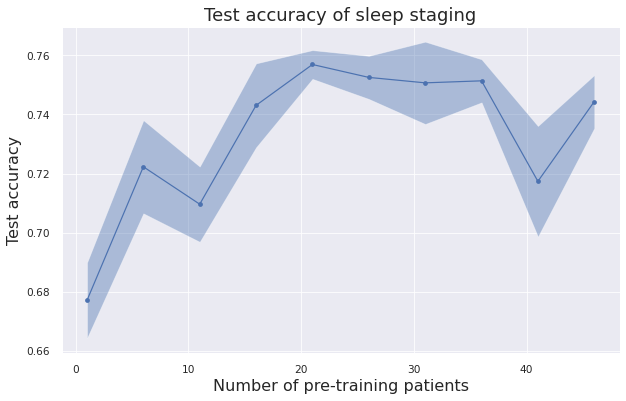

In [119]:
mean = acc_list_all.mean(0)
std = acc_list_all.std(0)

plt.figure(figsize=(10,6))
plt.plot(nb_subjects, mean, marker="o")
plt.fill_between(nb_subjects, mean - std, mean + std, alpha=0.4)
plt.xlabel("Number of pre-training patients", fontsize=16)
plt.ylabel("Test accuracy", fontsize=16)
plt.savefig("img/finetune_per_size.png", dpi=200, bbox_inches='tight', pad_inches=0, facecolor=(1,1,1,0))
plt.title("Test accuracy of sleep staging", fontsize=18);